### Installing Detectron2

In [1]:
!python -m pip install 'git+https://github.com/facebookresearch/detectron2.git'

  Cloning https://github.com/facebookresearch/detectron2.git to /tmp/pip-req-build-fvqml70f
  Running command git clone --filter=blob:none --quiet https://github.com/facebookresearch/detectron2.git /tmp/pip-req-build-fvqml70f
  Resolved https://github.com/facebookresearch/detectron2.git to commit bcfd464d0c810f0442d91a349c0f6df945467143
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 50.2/50.2 kB 2.9 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 78.2/78.2 kB 5.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 117.0/117.0 kB 11.4 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 154.5/154.5 kB 13.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 79.5/79.5 kB 7.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.8/1.8 MB 59.8 MB/s eta 0:00:00
  Created wheel for detectron2: filename=detectron2-0.6-cp3

### Importing Libraries

In [2]:
from detectron2.engine import DefaultPredictor, DefaultTrainer
from detectron2.config import get_cfg
from detectron2.data import MetadataCatalog, DatasetCatalog
from detectron2.utils.visualizer import Visualizer, ColorMode
from detectron2 import model_zoo
from detectron2.data.datasets import register_coco_instances
from detectron2.modeling import build_model
from detectron2.evaluation import COCOEvaluator, inference_on_dataset
from detectron2.data import build_detection_test_loader
from detectron2.utils.logger import setup_logger
setup_logger()

import random
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt


### Downloading Dataset

In [3]:
!curl -L "https://universe.roboflow.com/ds/2HLDhardTo?key=lDFNgZw6Hn" > roboflow.zip; unzip roboflow.zip; rm roboflow.zip

Streaming output truncated to the last 5000 lines.
 extracting: train/JWitt-RCP_mp4-37_jpg.rf.094331a0a55d7c1efb29da403f11873b.jpg  
 extracting: train/JWitt-RCP_mp4-37_jpg.rf.8d20bf0e13174ed623b2c8ceb6cfdfb5.jpg  
 extracting: train/JWitt-RCP_mp4-37_jpg.rf.ecb4e7934f78696f4bcc27fc5de10d52.jpg  
 extracting: train/JWitt-RCP_mp4-39_jpg.rf.9c4b58d0418f56b665a8a2640aa52a4f.jpg  
 extracting: train/JWitt-RCP_mp4-39_jpg.rf.a99914659eb9e4fbd05afed9639630eb.jpg  
 extracting: train/JWitt-RCP_mp4-39_jpg.rf.b0adf3922846e323776845e6d5894c2b.jpg  
 extracting: train/JWitt-RCP_mp4-3_jpg.rf.08126c72eeaecf51e2ed0ac2e9a23594.jpg  
 extracting: train/JWitt-RCP_mp4-3_jpg.rf.5512012a3dfa035da778250d4c5c90e9.jpg  
 extracting: train/JWitt-RCP_mp4-3_jpg.rf.8f4f2689ab4ceee50f91b44486b08d01.jpg  
 extracting: train/JWitt-RCP_mp4-42_jpg.rf.189b976079e4b6144675c5050b4cc32a.jpg  
 extracting: train/JWitt-RCP_mp4-42_jpg.rf.7e9aa57df8fda91b94aefe415ec5c63e.jpg  
 extracting: train/JWitt-RCP_mp4-42_jpg.rf.8ff902c

### Registering the dataset

In [4]:
register_coco_instances("my_dataset_train", {}, "/content/train/_annotations.coco.json", "/content/train")
register_coco_instances("my_dataset_val", {}, "/content/valid/_annotations.coco.json", "/content/valid")
register_coco_instances("my_dataset_test", {}, "/content/test/_annotations.coco.json", "/content/test")

### Visualisation of Data

WARNING [08/11 06:32:32 d2.data.datasets.coco]: 
Category ids in annotations are not in [1, #categories]! We'll apply a mapping for you.

[08/11 06:32:32 d2.data.datasets.coco]: Loaded 6455 images in COCO format from /content/train/_annotations.coco.json


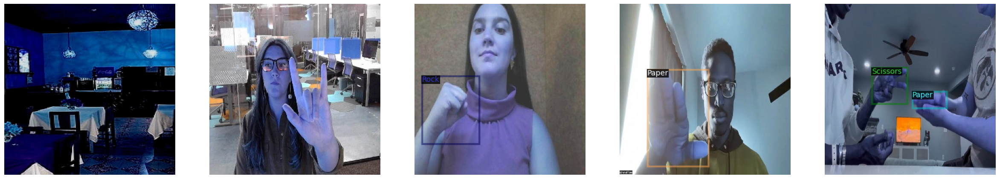

In [5]:

my_dataset_train_metadata = MetadataCatalog.get("my_dataset_train")
dataset_dicts = DatasetCatalog.get("my_dataset_train")

fig, axs = plt.subplots(1, 5, figsize=(30, 10))

for ax, d in zip(axs, random.sample(dataset_dicts, 5)):
    img = cv2.imread(d["file_name"])
    visualizer = Visualizer(img[:, :, ::-1], metadata=my_dataset_train_metadata, scale=0.5)
    vis = visualizer.draw_dataset_dict(d)
    img_rgb = vis.get_image()[:, :, ::-1]

    ax.imshow(img_rgb)
    ax.axis('off')

plt.show()

### Model Loading, setting up configurations and Training

In [6]:
cfg = get_cfg()
cfg.merge_from_file(model_zoo.get_config_file("COCO-Detection/faster_rcnn_R_50_FPN_3x.yaml"))
cfg.DATASETS.TRAIN = ("my_dataset_train",)
cfg.DATASETS.TEST = ()
cfg.DATALOADER.NUM_WORKERS = 2
cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url("COCO-Detection/faster_rcnn_R_50_FPN_3x.yaml")
cfg.SOLVER.IMS_PER_BATCH = 2
cfg.SOLVER.BASE_LR = 0.0025
cfg.SOLVER.MAX_ITER = 1500
cfg.SOLVER.STEPS = []
cfg.MODEL.ROI_HEADS.BATCH_SIZE_PER_IMAGE = 128
cfg.MODEL.ROI_HEADS.NUM_CLASSES = 3

os.makedirs(cfg.OUTPUT_DIR, exist_ok=True)

model = build_model(cfg)
for param in model.backbone.parameters():
    param.requires_grad = False

trainer = DefaultTrainer(cfg)
trainer.resume_or_load(resume=True)
trainer.model.to("cuda")
trainer.train()

[08/11 06:32:37 d2.engine.defaults]: Model:
GeneralizedRCNN(
  (backbone): FPN(
    (fpn_lateral2): Conv2d(256, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output2): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral3): Conv2d(512, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output3): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral4): Conv2d(1024, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output4): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral5): Conv2d(2048, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output5): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (top_block): LastLevelMaxPool()
    (bottom_up): ResNet(
      (stem): BasicStem(
        (conv1): Conv2d(
          3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False
          (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
        )
      )
      (res

model_final_280758.pkl: 167MB [00:01, 125MB/s]                           
roi_heads.box_predictor.bbox_pred.{bias, weight}
roi_heads.box_predictor.cls_score.{bias, weight}


[08/11 06:32:39 d2.engine.train_loop]: Starting training from iteration 0


/usr/local/lib/python3.10/dist-packages/torch/functional.py:512: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at ../aten/src/ATen/native/TensorShape.cpp:3587.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]


[08/11 06:32:53 d2.utils.events]:  eta: 0:07:27  iter: 19  total_loss: 1.549  loss_cls: 1.255  loss_box_reg: 0.307  loss_rpn_cls: 0.01798  loss_rpn_loc: 0.007733    time: 0.2978  last_time: 0.2917  data_time: 0.0326  last_data_time: 0.0114   lr: 4.9952e-05  max_mem: 1900M
[08/11 06:33:02 d2.utils.events]:  eta: 0:07:05  iter: 39  total_loss: 1.063  loss_cls: 0.5469  loss_box_reg: 0.3499  loss_rpn_cls: 0.01498  loss_rpn_loc: 0.007737    time: 0.2977  last_time: 0.2579  data_time: 0.0171  last_data_time: 0.0053   lr: 9.9902e-05  max_mem: 1900M
[08/11 06:33:08 d2.utils.events]:  eta: 0:06:48  iter: 59  total_loss: 0.6634  loss_cls: 0.3117  loss_box_reg: 0.3371  loss_rpn_cls: 0.02245  loss_rpn_loc: 0.007163    time: 0.2922  last_time: 0.2581  data_time: 0.0090  last_data_time: 0.0116   lr: 0.00014985  max_mem: 1900M
[08/11 06:33:14 d2.utils.events]:  eta: 0:06:52  iter: 79  total_loss: 0.6993  loss_cls: 0.3449  loss_box_reg: 0.3697  loss_rpn_cls: 0.01301  loss_rpn_loc: 0.005814    time: 0.

In [7]:
%load_ext tensorboard
%tensorboard --logdir output

<IPython.core.display.Javascript object>

### Inference and Evaluaton

In [8]:
cfg.MODEL.WEIGHTS = os.path.join(cfg.OUTPUT_DIR, "model_final.pth")
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.5
cfg.DATASETS.TEST = ("my_dataset_test", )
predictor = DefaultPredictor(cfg)

[08/11 06:40:57 d2.checkpoint.detection_checkpoint]: [DetectionCheckpointer] Loading from ./output/model_final.pth ...


WARNING [08/11 06:40:58 d2.data.datasets.coco]: 
Category ids in annotations are not in [1, #categories]! We'll apply a mapping for you.

[08/11 06:40:58 d2.data.datasets.coco]: Loaded 304 images in COCO format from /content/test/_annotations.coco.json


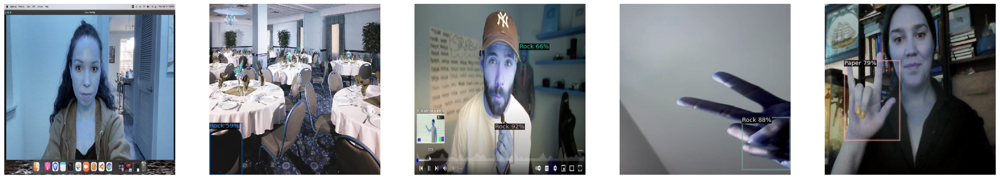

In [9]:
dataset_dicts = DatasetCatalog.get("my_dataset_test")

fig, axs = plt.subplots(1, 5, figsize=(30, 10))

for ax, d in zip(axs, random.sample(dataset_dicts, 5)):
    im = cv2.imread(d["file_name"])
    outputs = predictor(im)
    v = Visualizer(im[:, :, ::-1],
                   metadata=my_dataset_train_metadata,
                   scale=0.6
    )
    v = v.draw_instance_predictions(outputs["instances"].to("cpu"))
    img_rgb = v.get_image()[:, :, ::-1]

    ax.imshow(img_rgb)
    ax.axis('off')

plt.show()

Evaluating on Validation Dataset

In [10]:
val_evaluator = COCOEvaluator("my_dataset_val", output_dir= "./output")
val_loader = build_detection_test_loader(cfg, "my_dataset_val")
print(inference_on_dataset(trainer.model, val_loader, val_evaluator))

WARNING [08/11 06:40:59 d2.data.datasets.coco]: 
Category ids in annotations are not in [1, #categories]! We'll apply a mapping for you.

[08/11 06:40:59 d2.data.datasets.coco]: Loaded 576 images in COCO format from /content/valid/_annotations.coco.json
[08/11 06:40:59 d2.data.build]: Distribution of instances among all 4 categories:
|   category    | #instances   |  category  | #instances   |  category  | #instances   |
|:-------------:|:-------------|:----------:|:-------------|:----------:|:-------------|
| rock-paper-.. | 0            |   Paper    | 139          |    Rock    | 141          |
|   Scissors    | 120          |            |              |            |              |
|     total     | 400          |            |              |            |              |
[08/11 06:40:59 d2.data.dataset_mapper]: [DatasetMapper] Augmentations used in inference: [ResizeShortestEdge(short_edge_length=(800, 800), max_size=1333, sample_style='choice')]
[08/11 06:40:59 d2.data.common]: Seriali

/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


[08/11 06:41:00 d2.evaluation.evaluator]: Inference done 11/576. Dataloading: 0.0045 s/iter. Inference: 0.0856 s/iter. Eval: 0.0003 s/iter. Total: 0.0905 s/iter. ETA=0:00:51
[08/11 06:41:06 d2.evaluation.evaluator]: Inference done 66/576. Dataloading: 0.0061 s/iter. Inference: 0.0858 s/iter. Eval: 0.0004 s/iter. Total: 0.0924 s/iter. ETA=0:00:47
[08/11 06:41:11 d2.evaluation.evaluator]: Inference done 124/576. Dataloading: 0.0046 s/iter. Inference: 0.0846 s/iter. Eval: 0.0003 s/iter. Total: 0.0896 s/iter. ETA=0:00:40
[08/11 06:41:16 d2.evaluation.evaluator]: Inference done 183/576. Dataloading: 0.0038 s/iter. Inference: 0.0842 s/iter. Eval: 0.0003 s/iter. Total: 0.0884 s/iter. ETA=0:00:34
[08/11 06:41:21 d2.evaluation.evaluator]: Inference done 238/576. Dataloading: 0.0043 s/iter. Inference: 0.0844 s/iter. Eval: 0.0003 s/iter. Total: 0.0892 s/iter. ETA=0:00:30
[08/11 06:41:26 d2.evaluation.evaluator]: Inference done 293/576. Dataloading: 0.0044 s/iter. Inference: 0.0847 s/iter. Eval: 0

/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


[08/11 06:41:51 d2.evaluation.evaluator]: Total inference time: 0:00:51.025948 (0.089362 s / iter per device, on 1 devices)
[08/11 06:41:51 d2.evaluation.evaluator]: Total inference pure compute time: 0:00:48 (0.084798 s / iter per device, on 1 devices)
[08/11 06:41:51 d2.evaluation.coco_evaluation]: Preparing results for COCO format ...
[08/11 06:41:51 d2.evaluation.coco_evaluation]: Saving results to ./output/coco_instances_results.json
[08/11 06:41:51 d2.evaluation.coco_evaluation]: Evaluating predictions with unofficial COCO API...
Loading and preparing results...
DONE (t=0.01s)
creating index...
index created!
[08/11 06:41:51 d2.evaluation.fast_eval_api]: Evaluate annotation type *bbox*
[08/11 06:41:51 d2.evaluation.fast_eval_api]: COCOeval_opt.evaluate() finished in 0.11 seconds.
[08/11 06:41:51 d2.evaluation.fast_eval_api]: Accumulating evaluation results...
[08/11 06:41:51 d2.evaluation.fast_eval_api]: COCOeval_opt.accumulate() finished in 0.02 seconds.
 Average Precision  (AP)

Evaluating on Test Dataset

In [11]:
test_evaluator = COCOEvaluator("my_dataset_test", output_dir= "./output")
test_loader = build_detection_test_loader(cfg, "my_dataset_test")
print(inference_on_dataset(predictor.model, test_loader, test_evaluator))

WARNING [08/11 06:41:51 d2.data.datasets.coco]: 
Category ids in annotations are not in [1, #categories]! We'll apply a mapping for you.

[08/11 06:41:51 d2.data.datasets.coco]: Loaded 304 images in COCO format from /content/test/_annotations.coco.json
[08/11 06:41:51 d2.data.build]: Distribution of instances among all 4 categories:
|   category    | #instances   |  category  | #instances   |  category  | #instances   |
|:-------------:|:-------------|:----------:|:-------------|:----------:|:-------------|
| rock-paper-.. | 0            |   Paper    | 72           |    Rock    | 65           |
|   Scissors    | 67           |            |              |            |              |
|     total     | 204          |            |              |            |              |
[08/11 06:41:51 d2.data.dataset_mapper]: [DatasetMapper] Augmentations used in inference: [ResizeShortestEdge(short_edge_length=(800, 800), max_size=1333, sample_style='choice')]
[08/11 06:41:51 d2.data.common]: Serializ

/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


[08/11 06:41:56 d2.evaluation.evaluator]: Inference done 48/304. Dataloading: 0.0072 s/iter. Inference: 0.0854 s/iter. Eval: 0.0003 s/iter. Total: 0.0930 s/iter. ETA=0:00:23
[08/11 06:42:01 d2.evaluation.evaluator]: Inference done 104/304. Dataloading: 0.0063 s/iter. Inference: 0.0846 s/iter. Eval: 0.0003 s/iter. Total: 0.0914 s/iter. ETA=0:00:18
[08/11 06:42:06 d2.evaluation.evaluator]: Inference done 164/304. Dataloading: 0.0046 s/iter. Inference: 0.0838 s/iter. Eval: 0.0003 s/iter. Total: 0.0888 s/iter. ETA=0:00:12
[08/11 06:42:11 d2.evaluation.evaluator]: Inference done 222/304. Dataloading: 0.0043 s/iter. Inference: 0.0837 s/iter. Eval: 0.0003 s/iter. Total: 0.0884 s/iter. ETA=0:00:07
[08/11 06:42:16 d2.evaluation.evaluator]: Inference done 277/304. Dataloading: 0.0049 s/iter. Inference: 0.0839 s/iter. Eval: 0.0003 s/iter. Total: 0.0892 s/iter. ETA=0:00:02
[08/11 06:42:18 d2.evaluation.evaluator]: Total inference time: 0:00:26.593977 (0.088943 s / iter per device, on 1 devices)
[0